In [1]:
import numpy as np
import librosa
import librosa.display
from IPython.display import Audio
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt
from scipy.signal import butter, lfilter, welch, filtfilt

C:\Users\aorus\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


# Exemple 1: separation du bruit

In [2]:
data, fs = librosa.load('bruit.wav') # 200 1500
# Ajout du bruit
RMS=np.sqrt(np.mean(data**2))
STD_n= 0.09
noise=np.random.normal(0, STD_n,data.shape[0])
signal_noise = data+noise
Audio(signal_noise, rate=fs)

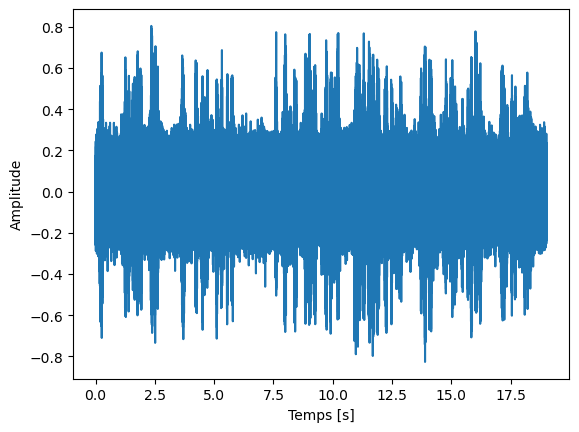

In [3]:
# signal
time = np.linspace(0,signal_noise.shape[0]/fs,signal_noise.shape[0])
plt.plot(time,signal_noise)
plt.xlabel("Temps [s]")
plt.ylabel("Amplitude")
plt.show()

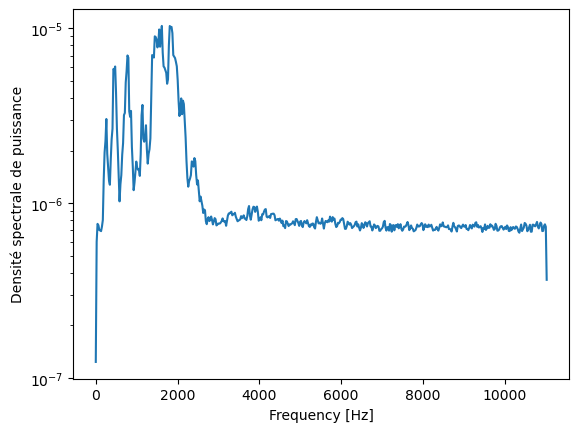

In [4]:
# frequence de coupure 
f1 = 200
f2 = 2200
# Coeffecient du filtre butterworth
b, a = butter(5, [f1*2/fs, f2*2/fs], btype='band')
voice = filtfilt(b, a, signal_noise)
noise = signal_noise - voice
# Densité spectrale de puissance
freq, Pxx = welch(signal_noise, fs, nperseg=1024)
# Visualisation
plt.semilogy(freq, Pxx)
plt.xlabel('Frequency [Hz]')
plt.ylabel('Densité spectrale de puissance')
# plt.xlim(0, 1000)
plt.show()

In [5]:
#parole
Audio(voice, rate=fs)

In [6]:
#bruit
Audio(noise, rate=fs)

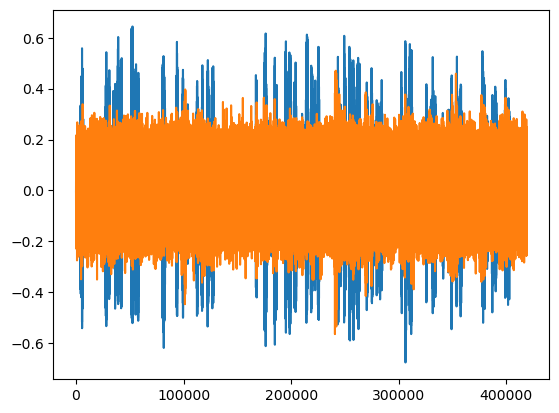

In [7]:
# Visualisation des données audio filtrées
plt.plot(voice, label="Voix")
plt.plot(noise, label="Instruments")
plt.show()

# Exemple 2 Separation du son de la pluie

In [8]:
# Exemple 2 separation de la pluie
data, fs = librosa.load('pluie.wav') # 200 1500
Audio(data, rate=fs)

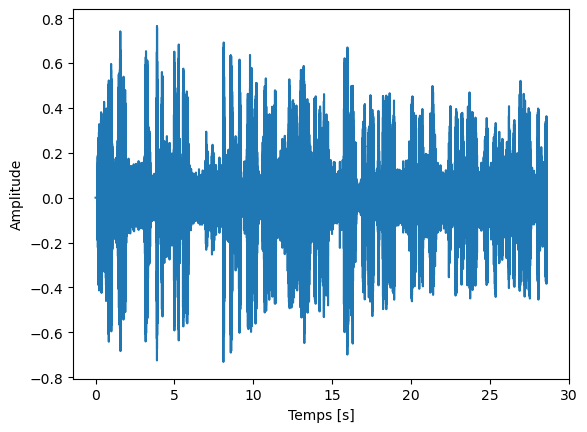

In [9]:
f1 = 200
f2 = 2200
# Visualisation du signal
time = np.linspace(0,data.shape[0]/fs,data.shape[0])
plt.plot(time,data)
plt.xlabel("Temps [s]")
plt.ylabel("Amplitude")
plt.show()

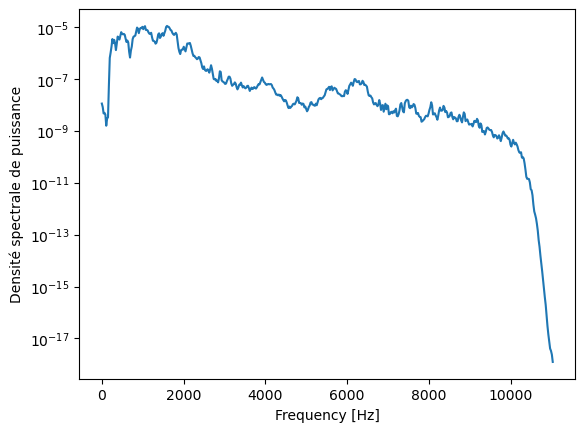

In [10]:
# Coef du filtre butterworth
b, a = butter(5, [f1*2/fs, f2*2/fs], btype='band')
voice = filtfilt(b, a, data)
rain = data - voice
# Densité spectrale de puissance
freq, Pxx = welch(data, fs, nperseg=1024)
# Visualisation
plt.semilogy(freq, Pxx)
plt.xlabel('Frequency [Hz]')
plt.ylabel('Densité spectrale de puissance')
plt.show()

In [11]:
#parole
Audio(voice, rate=fs)

In [12]:
#pluie
Audio(rain, rate=fs)

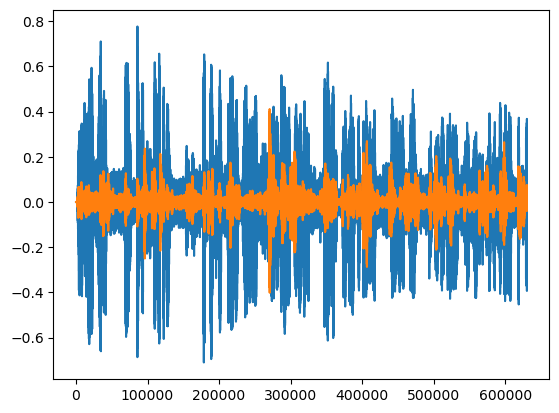

In [14]:
# Visualisation des données audio filtrées
plt.plot(voice, label="Voix")
plt.plot(rain, label="Instruments")
plt.show()

# Exemple 3 Separation des instruments musicaux

In [15]:
data, fs = librosa.load('tsg.wav') # 200 1000
Audio(data, rate=fs)

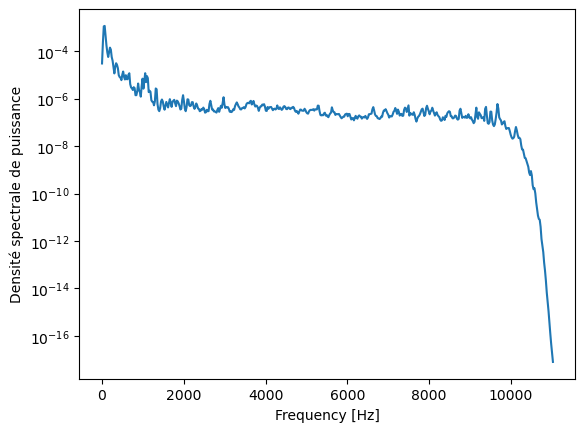

In [16]:
f1 = 200
f2 = 1000
# Densité spectrale de puissance
freq, Pxx = welch(data, fs, nperseg=1024)
# Visualisation
plt.semilogy(freq, Pxx)
plt.xlabel('Frequency [Hz]')
plt.ylabel('Densité spectrale de puissance')
# plt.xlim(0, 1000)
plt.show()

In [17]:
b, a = butter(5, [f1*2/fs, f2*2/fs], btype='band')
voice = filtfilt(b, a, data)
instruments = data - voice

In [18]:
Audio(voice, rate=fs)

In [19]:
Audio(instruments, rate=fs)